In [1]:
! pip install kagglehub

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [kagglehub]


In [3]:
! pip install "numpy<2.0"

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 64.8 MB/s  0:00:00 eta 0:00:01
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.6
    Uninstalling numpy-2.2.6:
      Successfully uninstalled numpy-2.2.6


In [4]:
import torch

print("GPU available:", torch.cuda.is_available())

print("Number of GPUs:", torch.cuda.device_count())

if torch.cuda.is_available():
    print("Current GPU:", torch.cuda.get_device_name(0))


GPU available: True
Number of GPUs: 1
Current GPU: NVIDIA RTX A4000


In [170]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("almightyj/person-face-sketches")

print("Path to dataset files:", path)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.29G/1.29G [00:47<00:00, 29.4MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/almightyj/person-face-sketches/versions/2


In [171]:
! ls /root/.cache/kagglehub/datasets/almightyj/person-face-sketches/versions/2

test  train  val


In [174]:
base_dir = r"root/.cache/kagglehub/datasets/almightyj/person-face-sketches/versions/2"

In [175]:
from PIL import Image
import matplotlib.pyplot as plt

In [178]:
! ls /root/.cache/kagglehub/datasets/almightyj/person-face-sketches/versions/2/train/photos

0.jpg	   1390.jpg   17784.jpg  21690.jpg  25488.jpg  29288.jpg  6121.jpg
10001.jpg  13912.jpg  17785.jpg  21691.jpg  25489.jpg  29289.jpg  6123.jpg
10003.jpg  13913.jpg  17786.jpg  21693.jpg  25490.jpg  2928.jpg   6124.jpg
10005.jpg  13914.jpg  17787.jpg  21696.jpg  25492.jpg  29290.jpg  6125.jpg
10006.jpg  13915.jpg  17788.jpg  21697.jpg  25493.jpg  29291.jpg  6126.jpg
10007.jpg  13917.jpg  17790.jpg  21699.jpg  25494.jpg  29292.jpg  6127.jpg
10008.jpg  13918.jpg  17791.jpg  2169.jpg   25495.jpg  29294.jpg  612.jpg
10011.jpg  13919.jpg  17793.jpg  216.jpg    25497.jpg  29297.jpg  6131.jpg
10012.jpg  1391.jpg   17794.jpg  21701.jpg  25498.jpg  29298.jpg  6132.jpg
10013.jpg  13921.jpg  17796.jpg  21702.jpg  25499.jpg  29299.jpg  6134.jpg
10014.jpg  13922.jpg  17797.jpg  21703.jpg  2549.jpg   2929.jpg   6136.jpg
10015.jpg  13923.jpg  17798.jpg  21704.jpg  254.jpg    29300.jpg  6137.jpg
10018.jpg  13924.jpg  17799.jpg  21705.jpg  25500.jpg  29301.jpg  6139.jpg
10019.jpg  13926.jpg  1779.j

In [181]:
! ls /root/.cache/kagglehub/datasets/almightyj/person-face-sketches/versions/2/train/

photos	sketches


In [179]:
image = Image.open("/root/.cache/kagglehub/datasets/almightyj/person-face-sketches/versions/2/train/photos/0.jpg")

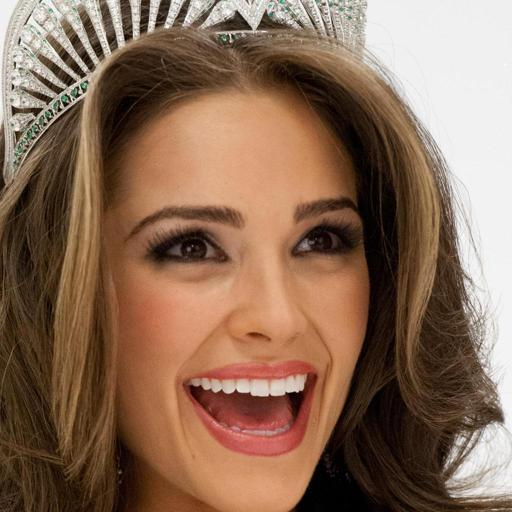

In [180]:
image

In [183]:
image = Image.open("/root/.cache/kagglehub/datasets/almightyj/person-face-sketches/versions/2/train/sketches/0.jpg")

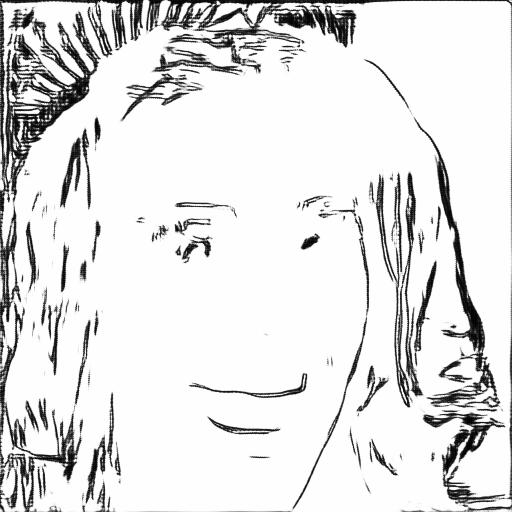

In [184]:
image

In [185]:
image.size

(512, 512)

# Tao Data

In [186]:
import os
from PIL import Image
import shutil

# Đường dẫn nguồn
train_photo = "/root/.cache/kagglehub/datasets/almightyj/person-face-sketches/versions/2/train/photos"
train_sketches = "/root/.cache/kagglehub/datasets/almightyj/person-face-sketches/versions/2/train/sketches"
test_photo = "/root/.cache/kagglehub/datasets/almightyj/person-face-sketches/versions/2/test/photos"
test_sketches = "/root/.cache/kagglehub/datasets/almightyj/person-face-sketches/versions/2/test/sketches"
val_photo = "/root/.cache/kagglehub/datasets/almightyj/person-face-sketches/versions/2/val/photos"
val_sketches = "/root/.cache/kagglehub/datasets/almightyj/person-face-sketches/versions/2/val/sketches"

# Đường dẫn đích (tạo mới)
dataset_split = "dataset_split"
train_dir = os.path.join(dataset_split, "train")
test_dir = os.path.join(dataset_split, "test")
val_dir = os.path.join(dataset_split, "val")

# Tạo các thư mục nếu chưa tồn tại
for dir_path in [train_dir, test_dir, val_dir]:
    os.makedirs(os.path.join(dir_path, "image"), exist_ok=True)
    os.makedirs(os.path.join(dir_path, "sketch"), exist_ok=True)

# Hàm resize và lưu ảnh
def resize_and_save(source_dir, target_image_dir, target_sketch_dir, size=(128, 128)):
    for filename in os.listdir(source_dir):
        if filename.endswith(('.png', '.jpg', '.jpeg')):
            
            img_path = os.path.join(source_dir, filename)
            
            # Mở và resize ảnh
            img = Image.open(img_path).convert('RGB')
            img_resized = img.resize(size, Image.Resampling.LANCZOS)
            
            # Lưu ảnh và sketch
            if "photo" in source_dir.lower():
                img_resized.save(os.path.join(target_image_dir, filename))
            elif "sketch" in source_dir.lower():
                img_resized.save(os.path.join(target_sketch_dir, filename))

resize_and_save(train_photo, os.path.join(train_dir, "image"), os.path.join(train_dir, "sketch"), size=(128, 128))
resize_and_save(train_sketches, os.path.join(train_dir, "image"), os.path.join(train_dir, "sketch"), size=(128, 128))

# Xử lý test
resize_and_save(test_photo, os.path.join(test_dir, "image"), os.path.join(test_dir, "sketch"), size=(128, 128))
resize_and_save(test_sketches, os.path.join(test_dir, "image"), os.path.join(test_dir, "sketch"), size=(128, 128))

# Xử lý val
resize_and_save(val_photo, os.path.join(val_dir, "image"), os.path.join(val_dir, "sketch"), size=(128, 128))
resize_and_save(val_sketches, os.path.join(val_dir, "image"), os.path.join(val_dir, "sketch"), size=(128, 128))

print(f"Đã resize và lưu ảnh vào {dataset_split}/{{train,test,val}}/{{image,sketch}}")

Đã resize và lưu ảnh vào dataset_split/{train,test,val}/{image,sketch}


# SGAN2-ADA

In [187]:
!nvidia-smi -L

GPU 0: NVIDIA RTX A4000 (UUID: GPU-38e2e352-765c-95de-134b-2f379d9b59ce)


In [51]:
! git clone https://github.com/dvschultz/stylegan2-ada-pytorch

Cloning into 'stylegan2-ada-pytorch'...
remote: Enumerating objects: 577, done.
remote: Counting objects: 100% (31/31), done.
remote: Compressing objects: 100% (14/14), done.
^Cceiving objects:   6% (36/577), 900.00 KiB | 56.00 KiB/s


In [188]:
! ls

best_encoder.pth  image.zip	   results		  venv
checkpoints	  insightface	   Sgan.ipynb
dataset_split	  ninja-linux.zip  sketch_image
generated_images  pretrained	   stylegan2-ada-pytorch


In [53]:
!mkdir pretrained

In [54]:
!pip install gdown

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [gdown]


In [55]:
! gdown --id 1BUL-RIzXC7Bpnz2cn230CbA4eT7_Etp0 -O pretrained/ffhq256.pkl

/root/SGAN/venv/lib/python3.10/site-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1BUL-RIzXC7Bpnz2cn230CbA4eT7_Etp0
From (redirected): https://drive.google.com/uc?id=1BUL-RIzXC7Bpnz2cn230CbA4eT7_Etp0&confirm=t&uuid=031aeb5b-436a-48ee-a9bd-a9512ff01d97
To: /root/SGAN/pretrained/ffhq256.pkl
100%|████████████████████████████████████████| 296M/296M [00:11<00:00, 26.9MB/s]


In [56]:
! ls pretrained

ffhq256.pkl


In [57]:
! ls

dataset_split  pretrained  sketch_image		  venv
image	       Sgan.ipynb  stylegan2-ada-pytorch


In [58]:
! ls

dataset_split  pretrained  sketch_image		  venv
image	       Sgan.ipynb  stylegan2-ada-pytorch


In [59]:
! pip install click

In [192]:
!zip -r dataset_split/train/images.zip dataset_split/train/image

  adding: dataset_split/train/image/ (stored 0%)
  adding: dataset_split/train/image/24315.jpg (deflated 3%)
  adding: dataset_split/train/image/19535.jpg (deflated 3%)
  adding: dataset_split/train/image/6727.jpg (deflated 3%)
  adding: dataset_split/train/image/15571.jpg (deflated 4%)
  adding: dataset_split/train/image/8243.jpg (deflated 4%)
  adding: dataset_split/train/image/18403.jpg (deflated 4%)
  adding: dataset_split/train/image/29536.jpg (deflated 3%)
  adding: dataset_split/train/image/20814.jpg (deflated 4%)
  adding: dataset_split/train/image/22403.jpg (deflated 4%)
  adding: dataset_split/train/image/13076.jpg (deflated 3%)
  adding: dataset_split/train/image/6886.jpg (deflated 3%)
  adding: dataset_split/train/image/29711.jpg (deflated 4%)
  adding: dataset_split/train/image/7731.jpg (deflated 4%)
  adding: dataset_split/train/image/25037.jpg (deflated 3%)
  adding: dataset_split/train/image/27269.jpg (deflated 4%)
  adding: dataset_split/train/image/20134.jpg (deflated

In [193]:
!python stylegan2-ada-pytorch/dataset_tool.py \
--source=dataset_split/train/images.zip --dest=image.zip

  0%|                                                 | 0/20655 [00:00<?, ?it/s]/root/SGAN/stylegan2-ada-pytorch/dataset_tool.py:429: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  img = PIL.Image.fromarray(img, { 1: 'L', 3: 'RGB' }[channels])
100%|████████████████████████████████████| 20655/20655 [00:25<00:00, 815.29it/s]


In [1]:
#required: definitely edit these!
dataset_path = 'image.zip'
resume_from = 'pretrained/ffhq256.pkl'
train_count = 2000
aug_strength = 0.0
mirror_x = True
#mirror_y = False

#optional: you might not need to edit these
gamma_value = 10.0
augs = 'bgc'
snapshot_count = 4

In [62]:
!ls

dataset_split  image.zip   Sgan.ipynb	 stylegan2-ada-pytorch
image	       pretrained  sketch_image  venv


In [63]:
!wget https://github.com/ninja-build/ninja/releases/download/v1.8.2/ninja-linux.zip
!sudo unzip ninja-linux.zip -d /usr/local/bin/
!sudo update-alternatives --install /usr/bin/ninja ninja /usr/local/bin/ninja 1 --force

--2025-10-01 05:51:40--  https://github.com/ninja-build/ninja/releases/download/v1.8.2/ninja-linux.zip
Resolving github.com (github.com)... 20.27.177.113
Connecting to github.com (github.com)|20.27.177.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://release-assets.githubusercontent.com/github-production-release-asset/1335132/d2f252e2-9801-11e7-9fbf-bc7b4e4b5c83?sp=r&sv=2018-11-09&sr=b&spr=https&se=2025-10-01T06%3A25%3A07Z&rscd=attachment%3B+filename%3Dninja-linux.zip&rsct=application%2Foctet-stream&skoid=96c2d410-5711-43a1-aedd-ab1947aa7ab0&sktid=398a6654-997b-47e9-b12b-9515b896b4de&skt=2025-10-01T05%3A24%3A39Z&ske=2025-10-01T06%3A25%3A07Z&sks=b&skv=2018-11-09&sig=iZYZauSsJa%2Bxs2wdnizOPDOJSIHCVDVB8dAgWQMc3EQ%3D&jwt=eyJ0eXAiOiJKV1QiLCJhbGciOiJIUzI1NiJ9.eyJpc3MiOiJnaXRodWIuY29tIiwiYXVkIjoicmVsZWFzZS1hc3NldHMuZ2l0aHVidXNlcmNvbnRlbnQuY29tIiwia2V5Ijoia2V5MSIsImV4cCI6MTc1OTI5ODIwMSwibmJmIjoxNzU5Mjk3OTAxLCJwYXRoIjoicmVsZWFzZWFzc2V0cHJvZHVjdGlvbi5ibG

In [64]:
!ninja --version

1.8.2


In [ ]:
# !python stylegan2-ada-pytorch/train.py ^
#   --gpus=1 ^
#   --metrics=None ^
#   --outdir=./results ^
#   --data=image.zip ^
#   --snap=4 ^
#   --resume=pretrained/ffhq256.pkl ^
#   --augpipe=bg ^
#   --initstrength=0.0 ^
#   --gamma=10.0 ^
#   --mirror=True ^
#   --mirrory=False ^
#   --nkimg=2000

In [1]:
!pip install numpy==1.25.2 --force-reinstall

  Using cached numpy-1.25.2-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (5.6 kB)
Using cached numpy-1.25.2-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.2 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.25.2
    Uninstalling numpy-1.25.2:
      Successfully uninstalled numpy-1.25.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
opencv-python-headless 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.25.2 which is incompatible.


In [68]:
import numpy
print(numpy.__version__) 

1.26.4


In [2]:
!python stylegan2-ada-pytorch/train.py \
  --gpus=1 \
  --metrics=None --outdir=./results \
  --data=$dataset_path --snap=$snapshot_count \
  --resume=$resume_from \
  --augpipe=$augs --initstrength=$aug_strength \
  --gamma=$gamma_value \
  --mirror=$mirror_x \
  --mirrory=False --nkimg=$train_count


Training options:
{
  "num_gpus": 1,
  "image_snapshot_ticks": 4,
  "network_snapshot_ticks": 4,
  "metrics": [],
  "random_seed": 0,
  "training_set_kwargs": {
    "class_name": "training.dataset.ImageFolderDataset",
    "path": "image.zip",
    "use_labels": false,
    "max_size": 17500,
    "xflip": true,
    "resolution": 128
  },
  "data_loader_kwargs": {
    "pin_memory": true,
    "num_workers": 3,
    "prefetch_factor": 2
  },
  "G_kwargs": {
    "class_name": "training.networks.Generator",
    "z_dim": 512,
    "w_dim": 512,
    "mapping_kwargs": {
      "num_layers": 2
    },
    "synthesis_kwargs": {
      "channel_base": 16384,
      "channel_max": 512,
      "num_fp16_res": 4,
      "conv_clamp": 256
    }
  },
  "D_kwargs": {
    "class_name": "training.networks.Discriminator",
    "block_kwargs": {},
    "mapping_kwargs": {},
    "epilogue_kwargs": {
      "mbstd_group_size": 4
    },
    "channel_base": 16384,
    "channel_max": 512,
    "num_fp16_res": 4,
    "conv_cl

In [4]:
! ls results/00002-image-mirror-auto1-gamma10-bgc-resumecustom

fakes002000.jpg  fakes002304.jpg  fakes002608.jpg  fakes002912.jpg
fakes002016.jpg  fakes002320.jpg  fakes002624.jpg  fakes002928.jpg
fakes002032.jpg  fakes002336.jpg  fakes002640.jpg  fakes002944.jpg
fakes002048.jpg  fakes002352.jpg  fakes002656.jpg  fakes002960.jpg
fakes002064.jpg  fakes002368.jpg  fakes002672.jpg  fakes002976.jpg
fakes002080.jpg  fakes002384.jpg  fakes002688.jpg  fakes002992.jpg
fakes002096.jpg  fakes002400.jpg  fakes002704.jpg  fakes003008.jpg
fakes002112.jpg  fakes002416.jpg  fakes002720.jpg  fakes003024.jpg
fakes002128.jpg  fakes002432.jpg  fakes002736.jpg  fakes_init.jpg
fakes002144.jpg  fakes002448.jpg  fakes002752.jpg  log.txt
fakes002160.jpg  fakes002464.jpg  fakes002768.jpg  network-snapshot-002976.pkl
fakes002176.jpg  fakes002480.jpg  fakes002784.jpg  network-snapshot-002992.pkl
fakes002192.jpg  fakes002496.jpg  fakes002800.jpg  network-snapshot-003008.pkl
fakes002208.jpg  fakes002512.jpg  fakes002816.jpg  network-snapshot-003024.pkl
fakes002224.jpg  fakes0

In [ ]:
! ls results/00003-image-mirror-auto1-gamma10-bgc-resumecustom

In [3]:
import sys
sys.path.append("stylegan2-ada-pytorch")  # đổi theo vị trí repo


In [4]:
import pickle
import dnnlib
import torch
from torchvision.utils import save_image

In [6]:
! ls results/00002-image-mirror-auto1-gamma10-bgc-resumecustom

fakes002000.jpg  fakes002288.jpg  fakes002576.jpg  fakes002864.jpg
fakes002016.jpg  fakes002304.jpg  fakes002592.jpg  fakes002880.jpg
fakes002032.jpg  fakes002320.jpg  fakes002608.jpg  fakes002896.jpg
fakes002048.jpg  fakes002336.jpg  fakes002624.jpg  fakes002912.jpg
fakes002064.jpg  fakes002352.jpg  fakes002640.jpg  fakes002928.jpg
fakes002080.jpg  fakes002368.jpg  fakes002656.jpg  fakes002944.jpg
fakes002096.jpg  fakes002384.jpg  fakes002672.jpg  fakes002960.jpg
fakes002112.jpg  fakes002400.jpg  fakes002688.jpg  fakes002976.jpg
fakes002128.jpg  fakes002416.jpg  fakes002704.jpg  fakes002992.jpg
fakes002144.jpg  fakes002432.jpg  fakes002720.jpg  fakes003008.jpg
fakes002160.jpg  fakes002448.jpg  fakes002736.jpg  fakes003024.jpg
fakes002176.jpg  fakes002464.jpg  fakes002752.jpg  fakes_init.jpg
fakes002192.jpg  fakes002480.jpg  fakes002768.jpg  log.txt
fakes002208.jpg  fakes002496.jpg  fakes002784.jpg  network-snapshot-003024.pkl
fakes002224.jpg  fakes002512.jpg  fakes002800.jpg  reals.jp

In [7]:
! ls results/00002-image-mirror-auto1-gamma10-bgc-resumecustom

fakes002000.jpg  fakes002288.jpg  fakes002576.jpg  fakes002864.jpg
fakes002016.jpg  fakes002304.jpg  fakes002592.jpg  fakes002880.jpg
fakes002032.jpg  fakes002320.jpg  fakes002608.jpg  fakes002896.jpg
fakes002048.jpg  fakes002336.jpg  fakes002624.jpg  fakes002912.jpg
fakes002064.jpg  fakes002352.jpg  fakes002640.jpg  fakes002928.jpg
fakes002080.jpg  fakes002368.jpg  fakes002656.jpg  fakes002944.jpg
fakes002096.jpg  fakes002384.jpg  fakes002672.jpg  fakes002960.jpg
fakes002112.jpg  fakes002400.jpg  fakes002688.jpg  fakes002976.jpg
fakes002128.jpg  fakes002416.jpg  fakes002704.jpg  fakes002992.jpg
fakes002144.jpg  fakes002432.jpg  fakes002720.jpg  fakes003008.jpg
fakes002160.jpg  fakes002448.jpg  fakes002736.jpg  fakes003024.jpg
fakes002176.jpg  fakes002464.jpg  fakes002752.jpg  fakes_init.jpg
fakes002192.jpg  fakes002480.jpg  fakes002768.jpg  log.txt
fakes002208.jpg  fakes002496.jpg  fakes002784.jpg  network-snapshot-003024.pkl
fakes002224.jpg  fakes002512.jpg  fakes002800.jpg  reals.jp

In [5]:
import legacy
import torch

checkpoint_path = "results/00002-image-mirror-auto1-gamma10-bgc-resumecustom/network-snapshot-003024.pkl"

device = 'cuda'
with open(checkpoint_path, 'rb') as f:
    G = legacy.load_network_pkl(f)['G_ema'].to(device)  # G_ema is the generator
G.eval()


Generator(
  (synthesis): SynthesisNetwork(
    (b4): SynthesisBlock(
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConnectedLayer()
      )
    )
    (b8): SynthesisBlock(
      (conv0): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConnectedLayer()
      )
    )
    (b16): SynthesisBlock(
      (conv0): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConnectedLayer()
      )
    )
    (b32): SynthesisBlock(
      (conv0): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConn

Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.


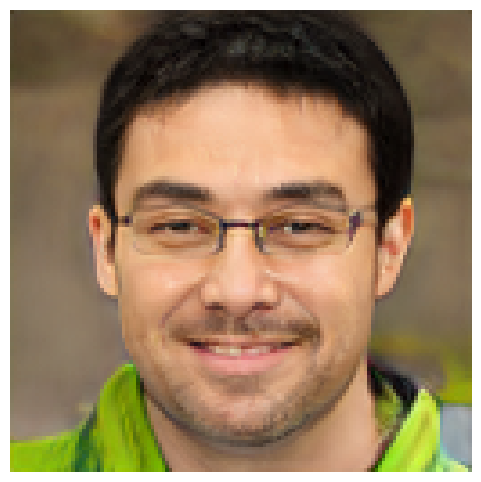

In [4]:
import matplotlib.pyplot as plt
# Sinh 1 ảnh random
z = torch.randn(1, G.z_dim).cuda()  # latent vector
label = torch.zeros([1, G.c_dim], device='cuda')  # nếu không conditional
img = G(z, label, truncation_psi=0.7)  # output: [1, 3, H, W]

# Chuyển từ [-1,1] sang [0,1] và lưu
img = (img.clamp(-1,1)+1)/2

img_np = img[0].permute(1, 2, 0).cpu().numpy()

plt.figure(figsize=(6,6))
plt.imshow(img_np)
plt.axis('off')
plt.show()

In [5]:
print("G.synthesis.num_ws:", G.synthesis.num_ws)

G.synthesis.num_ws: 12


In [6]:
G.z_dim

512

In [7]:
print(G.mapping.w_avg.shape)

torch.Size([512])


In [8]:
w_fake = torch.randn(1, 512).cuda()           # latent “ảo” ban đầu
w_plus = w_fake.unsqueeze(1).repeat(1, 12, 1) # broadcast cho 12 layer → [1, 12, 512]


In [9]:
w_plus.shape

torch.Size([1, 12, 512])

In [10]:
with torch.no_grad():
    img_gen = G.synthesis(w_plus, noise_mode='const')
    img_gen = (img_gen.clamp(-1,1)+1)/2

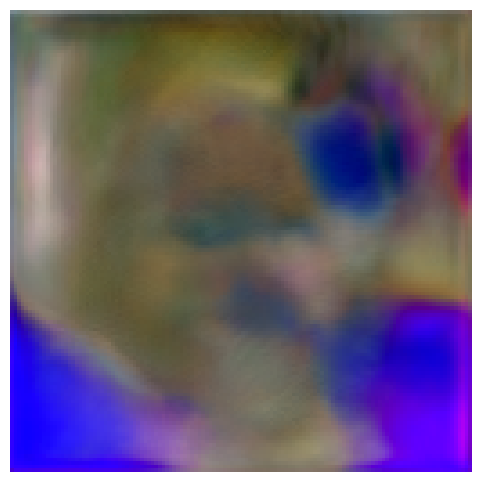

In [11]:
img_gen = img_gen[0].permute(1, 2, 0).cpu().numpy()
plt.figure(figsize=(6,6))
plt.imshow(img_gen)
plt.axis('off')
plt.show()

# Xây encoder 

In [6]:
import numpy as np
import torch
import torch.nn.functional as F
from torch import nn
from torch.nn import Linear, Conv2d, BatchNorm2d, PReLU, Sequential, Module
import torchvision.models as models

class GradualStyleBlock(Module):
    def __init__(self, in_c, out_c, spatial):
        super(GradualStyleBlock, self).__init__()
        self.out_c = out_c
        self.spatial = spatial
        num_pools = int(np.log2(spatial))
        modules = []
        modules += [Conv2d(in_c, out_c, kernel_size=3, stride=2, padding=1),
                    nn.LeakyReLU()]
        for i in range(num_pools - 1):
            modules += [
                Conv2d(out_c, out_c, kernel_size=3, stride=2, padding=1),
                nn.LeakyReLU()
            ]
        self.convs = nn.Sequential(*modules)
        self.linear = Linear(out_c, out_c)

    def forward(self, x):
        x = self.convs(x)
        x = x.view(-1, self.out_c)
        x = self.linear(x)
        return x

In [7]:
def _upsample_add(x, y):
  _, _, H, W = y.size()
  return F.interpolate(x, size=(H, W), mode='bilinear', align_corners=True) + y

In [24]:
class PSPEncoder(nn.Module):
    def __init__(self, gsb_channels=[64,32,16]):
        super().__init__()
        resnet = models.resnet50(pretrained=True)
        
        # Encoder layers
        self.layer0 = nn.Sequential(resnet.conv1, resnet.bn1, resnet.relu)  # [B,64,H/2,W/2]
        self.maxpool = resnet.maxpool  # [B,64,H/4,W/4]
        self.layer1 = resnet.layer1    # [B,256,H/4,W/4]
        self.layer2 = resnet.layer2    # [B,512,H/8,W/8]
        
        # Lateral conv layers
        self.latlayer1 = nn.Conv2d(64, 512, 1)
        self.latlayer2 = nn.Conv2d(256, 512, 1)
        self.latlayer3 = nn.Conv2d(512, 512, 1)
        
        # GradualStyleBlocks
        self.gsb3 = GradualStyleBlock(512, 512, gsb_channels[2])
        self.gsb2 = GradualStyleBlock(512, 512, gsb_channels[1])
        self.gsb1 = GradualStyleBlock(512, 512, gsb_channels[0])

    def forward(self, x):
        # Encoder
        layer_1 = self.layer0(x)
        m_pl = self.maxpool(layer_1)
        layer_2 = self.layer1(m_pl)
        layer_3 = self.layer2(layer_2)
        
        # Lateral layers
        lat3 = self.latlayer3(layer_3)
        lat2 = self.latlayer2(layer_2)
        lat1 = self.latlayer1(layer_1)
        
        # x1,x2
        x1 = self.gsb3(lat3)
        x2 = self.gsb3(lat3)
        # x2 = _upsample_add(lat3, lat2)  # theo code bạn trước đó, sẽ dùng x2 = _upsample_add
        x2_up = _upsample_add(lat3, lat2)
        
        # x3~x6
        x3 = self.gsb2(x2_up)
        x4 = self.gsb2(x2_up)
        x5 = self.gsb2(x2_up)
        x6 = self.gsb2(x2_up)
        
        # x3 = _upsample_add(x2, lat1)  # theo code bạn trước đó
        x3_up = _upsample_add(x2_up, lat1)
        
        # x7~x11
        x7 = self.gsb1(x3_up)
        x8 = self.gsb1(x3_up)
        x9 = self.gsb1(x3_up)
        x10 = self.gsb1(x3_up)
        x11 = self.gsb1(x3_up)
        x12 = self.gsb1(x3_up)
        latents = [x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12]
        out = torch.stack(latents, dim=1)
        
        return out

In [25]:
model = PSPEncoder()

/root/SGAN/venv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/root/SGAN/venv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [66]:
! pip install torchsummary

In [26]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [11]:

from torchsummary import summary

model = PSPEncoder().to(device)
model.eval()  # chuyển sang chế độ eval để tránh dropout/batchnorm training

# Input size là (3,128,128) vì ảnh 128x128 RGB
summary(model, input_size=(3, 128, 128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 64, 64]           9,408
       BatchNorm2d-2           [-1, 64, 64, 64]             128
              ReLU-3           [-1, 64, 64, 64]               0
         MaxPool2d-4           [-1, 64, 32, 32]               0
            Conv2d-5           [-1, 64, 32, 32]           4,096
       BatchNorm2d-6           [-1, 64, 32, 32]             128
              ReLU-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
       BatchNorm2d-9           [-1, 64, 32, 32]             128
             ReLU-10           [-1, 64, 32, 32]               0
           Conv2d-11          [-1, 256, 32, 32]          16,384
      BatchNorm2d-12          [-1, 256, 32, 32]             512
           Conv2d-13          [-1, 256, 32, 32]          16,384
      BatchNorm2d-14          [-1, 256,

In [12]:
! nvidia-smi

Wed Oct  1 19:00:27 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.154.05             Driver Version: 535.154.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA RTX A4000               Off | 00000000:0B:00.0 Off |                  Off |
| 41%   48C    P2              38W / 140W |    790MiB / 16376MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [18]:
x = torch.randn(1, 3, 128, 128).to(device)
model(x).shape

torch.Size([1, 12, 512])

# PSP

In [27]:
class PSP(nn.Module):
    def __init__(self, encoder,gen):
        super().__init__()
        self.encoder = encoder
        self.gen = gen
        for p in self.gen.parameters():
            p.requires_grad = False
            
        self.mean_ec = gen.mapping.w_avg

    def forward(self, x):
        w = self.encoder(x)+self.mean_ec.unsqueeze(0).unsqueeze(0)
        return self.gen.synthesis(w_plus, noise_mode='const')

In [28]:
import pickle
checkpoint_path = "results/00003-image-mirror-auto1-gamma10-bgc-resumecustom/network-snapshot-002176.pkl"
# Load checkpoint
with open(checkpoint_path, "rb") as f:
    G = pickle.load(f)['G_ema'].cuda()  # load generator ema
G.eval()  # để generator ở chế độ eval

Generator(
  (synthesis): SynthesisNetwork(
    (b4): SynthesisBlock(
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConnectedLayer()
      )
    )
    (b8): SynthesisBlock(
      (conv0): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConnectedLayer()
      )
    )
    (b16): SynthesisBlock(
      (conv0): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConnectedLayer()
      )
    )
    (b32): SynthesisBlock(
      (conv0): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConn

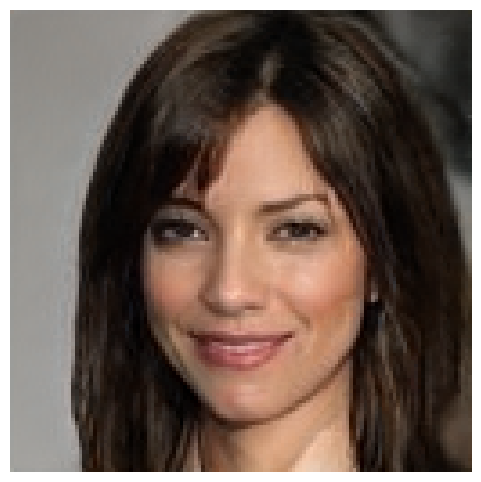

In [27]:
import matplotlib.pyplot as plt
# Sinh 1 ảnh random
z = torch.randn(1, G.z_dim).cuda()  # latent vector
label = torch.zeros([1, G.c_dim], device='cuda')  # nếu không conditional
img = G(z, label, truncation_psi=0.7)  # output: [1, 3, H, W]

# Chuyển từ [-1,1] sang [0,1] và lưu
img = (img.clamp(-1,1)+1)/2

img_np = img[0].permute(1, 2, 0).cpu().numpy()

plt.figure(figsize=(6,6))
plt.imshow(img_np)
plt.axis('off')
plt.show()

In [30]:
encoder = PSPEncoder().to(device)

In [31]:
model = PSP(encoder,G).to(device)

In [30]:
! nvidia-smi

Thu Oct  2 08:30:21 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.154.05             Driver Version: 535.154.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA RTX A4000               Off | 00000000:0B:00.0 Off |                  Off |
| 41%   42C    P2              37W / 140W |    830MiB / 16376MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [31]:

from torchsummary import summary

dummy = torch.randn(1, 3, 128, 128).cuda()
out = model(dummy)
print(type(out), getattr(out, "shape", None))

<class 'torch.Tensor'> torch.Size([1, 3, 128, 128])


In [92]:
!pip install torchinfo

In [32]:
x = torch.randn(1, 3, 128, 128).to(device)
w = model.encoder(x)
print("Encoder out:", w.shape)
img = model(x)
print("Final image:", img.shape)

Encoder out: torch.Size([1, 12, 512])
Final image: torch.Size([1, 3, 128, 128])


# Xây hàm loss

In [33]:
import torch.nn as nn
mse_loss = nn.MSELoss().to(device)

def l2(y_pred, y_true):
    return mse_loss(y_pred, y_true)

In [27]:
! pip install lpips

In [34]:
import lpips
lpips_loss = lpips.LPIPS(net='vgg')
lpips_loss.to(device)

Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/root/SGAN/venv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/root/SGAN/venv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /root/SGAN/venv/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


LPIPS(
  (scaling_layer): ScalingLayer()
  (net): vgg16(
    (slice1): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
    )
    (slice2): Sequential(
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
    )
    (slice3): Sequential(
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (13): ReLU(inplace=True)
      (14): Conv2d(256, 256, 

In [35]:
def lpips(y_pred, y_true):
    return lpips_loss(y_pred, y_true).mean()

In [38]:
def lreg(w_pre, w_avg):
    """
    w_pre: [batch, num_layers, latent_dim]
    w_avg: [1, latent_dim], [latent_dim], hoặc [1, 1, latent_dim]
    """
    batch_size, num_layers, latent_dim = w_pre.shape
    
    # Chuẩn hóa shape của w_avg
    if w_avg.dim() == 1:
        w_avg = w_avg.unsqueeze(0)  # [512] -> [1,512]
    elif w_avg.dim() == 3:  # Trường hợp [1, 1, latent_dim]
        w_avg = w_avg.squeeze(0)  # [1, 1, latent_dim] -> [1, latent_dim]
    
    # Đảm bảo w_avg trên cùng device với w_pre
    w_avg = w_avg.to(w_pre.device)
    
    # Repeat để khớp shape [batch, num_layers, latent_dim]
    w_avg_repeated = w_avg.unsqueeze(1).repeat(batch_size, num_layers, 1)
    
    return nn.MSELoss()(w_pre, w_avg_repeated)

In [155]:
! pip install pytorch_msssim

In [39]:
from pytorch_msssim import ssim
def lssim(y_pred, y_true):
    return 1 - ssim(y_pred, y_true, data_range=2.0, size_average=True)

In [29]:
!pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 13.4 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [torchmetrics] [torchmetrics]


In [46]:
y_true = torch.rand(1, 3, 128, 128)  
y_pred = torch.rand(1, 3, 128, 128)  

ssim_val = ssim_module(y_pred, y_true)
print(ssim_val)        
print(ssim_val.item())

tensor(0.0225, device='cuda:0')
0.022508569061756134


In [67]:
import torch.nn.functional as F

# data

In [1]:
import os
from PIL import Image
from torch.utils.data import Dataset
import torchvision.transforms as transforms
class FacePairDataset(Dataset):
    def __init__(self, dir_x, dir_y):
        self.dir_x = dir_x
        self.dir_y = dir_y
        self.files_x = sorted(os.listdir(dir_x))
        self.files_y = sorted(os.listdir(dir_y))

        
        self.transform = transforms.Compose([
            transforms.Resize((128,128)),           # resize nếu cần
            transforms.ToTensor(),                   # convert 0-255 → 0-1
            transforms.Normalize(mean=[0.5]*3, std=[0.5]*3)  # 0-1 → [-1,1]
        ])

    def __len__(self):
        return min(len(self.files_x), len(self.files_y))

    def __getitem__(self, idx):
        img_x = Image.open(os.path.join(self.dir_x, self.files_x[idx])).convert("RGB")
        img_y = Image.open(os.path.join(self.dir_y, self.files_y[idx])).convert("RGB")
        
        img_x = self.transform(img_x)
        img_y = self.transform(img_y)
        
        return img_x, img_y

/root/SGAN/venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
from torch.utils.data import DataLoader

dataset_train = FacePairDataset("dataset_split/train/sketch", "dataset_split/train/image")
dataset_val = FacePairDataset("dataset_split/val/sketch", "dataset_split/val/image")
dataset_test = FacePairDataset("dataset_split/test/sketch", "dataset_split/test/image")
loader_train = DataLoader(dataset_train, batch_size=16, shuffle=True)
loader_val = DataLoader(dataset_val, batch_size=16, shuffle=False)
loader_test = DataLoader(dataset_test, batch_size=16, shuffle=False)

In [42]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [43]:
import torch.optim as optim
optimizer = optim.Adam(model.encoder.parameters(), lr=1e-4)

In [44]:
checkpoint_dir = "checkpoints"
os.makedirs(checkpoint_dir, exist_ok=True)
save_every = 50 
img_save_dir = os.path.join(checkpoint_dir, "images")

In [45]:
patience = 5
best_val_loss = float('inf')
counter = 0
num_epochs = 5000

In [46]:
# Normalize [-1,1] -> [0,1] để lưu
def denorm(img):
    return (img.clamp(-1,1)+1)/2

In [47]:
import pickle

In [52]:
num_epochs = 100

In [ ]:
# Khởi tạo history để lưu trung bình loss mỗi epoch
history = {
    "train_total": [], "train_l2": [], "train_lpips": [], "train_reg": [], "train_ssim": [],
    "val_total": [], "val_l2": [], "val_lpips": [], "val_reg": [], "val_ssim": []
}


In [21]:
mean_ec = model.mean_ec.unsqueeze(0).unsqueeze(0).to(device)

In [55]:
from tqdm import tqdm
import torch
import torch.nn.functional as F
import os
import numpy as np
from torchvision.utils import save_image


# Đảm bảo model và mean_ec trên cùng device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Sử dụng thiết bị: {device}")
model.encoder = model.encoder.to(device)
model.gen = model.gen.to(device)
mean_ec = model.mean_ec.unsqueeze(0).unsqueeze(0).to(device)

best_val_loss = float('inf')
counter = 0
save_every = 5  # Giả định lưu checkpoint mỗi 5 epoch

for epoch in range(num_epochs):
    model.train()
    train_loss, train_l2, train_lpips, train_reg, train_ssim = 0, 0, 0, 0, 0
    
    # Tiến trình huấn luyện với tqdm
    with tqdm(loader_train, desc=f"Epoch {epoch+1}/{num_epochs} [Train]", unit="batch") as t:
        for x_batch, y_batch in t:
            x_batch = x_batch.to(device)
            y_batch = y_batch.to(device)

            optimizer.zero_grad()
            w_plus = model.encoder(x_batch) + mean_ec
            y_pred = model.gen.synthesis(w_plus, noise_mode='const')

            # Tính losses
            loss_l2 = l2(y_pred, y_batch)
            loss_lpips = lpips(y_pred, y_batch)
            loss_reg = lreg(w_plus, mean_ec)
            loss_ssim = lssim(y_pred, y_batch) 
            loss = loss_l2 + 0.0005 * loss_reg + 0.8 * loss_lpips + 0.5 * loss_ssim

            loss.backward()
            optimizer.step()

            # Cập nhật loss
            batch_size = x_batch.size(0)
            train_loss += loss.item() * batch_size
            train_l2 += loss_l2.item() * batch_size
            train_lpips += loss_lpips.item() * batch_size
            train_reg += loss_reg.item() * batch_size
            train_ssim += loss_ssim.item() * batch_size

            # Cập nhật tqdm
            t.set_postfix({
                'total': f"{loss.item():.4f}",
                'l2': f"{loss_l2.item():.4f}",
                'lpips': f"{loss_lpips.item():.4f}",
                'reg': f"{loss_reg.item():.4f}",
                'ssim': f"{loss_ssim.item():.4f}"
            })

    # Tính trung bình loss cho epoch
    train_loss /= len(loader_train.dataset)
    train_l2 /= len(loader_train.dataset)
    train_lpips /= len(loader_train.dataset)
    train_reg /= len(loader_train.dataset)
    train_ssim /= len(loader_train.dataset)

    # Lưu vào history
    history["train_total"].append(train_loss)
    history["train_l2"].append(train_l2)
    history["train_lpips"].append(train_lpips)
    history["train_reg"].append(train_reg)
    history["train_ssim"].append(train_ssim)

    # Validation
    model.eval()
    val_loss, val_l2, val_lpips, val_reg, val_ssim = 0, 0, 0, 0, 0
    
    with torch.no_grad():
        with tqdm(loader_val, desc=f"Epoch {epoch+1}/{num_epochs} [Val]", unit="batch") as t:
            for x_batch, y_batch in t:
                x_batch = x_batch.to(device)
                y_batch = y_batch.to(device)
                w_plus = model.encoder(x_batch) + mean_ec
                y_pred = model.gen.synthesis(w_plus, noise_mode='const')

                loss_l2 = l2(y_pred, y_batch)
                loss_lpips = lpips(y_pred, y_batch)
                loss_reg = lreg(w_plus, mean_ec)
                loss_ssim = lssim(y_pred, y_batch)
                loss = loss_l2 + 0.0005 * loss_reg + 0.8 * loss_lpips + 0.5 * loss_ssim

                batch_size = x_batch.size(0)
                val_loss += loss.item() * batch_size
                val_l2 += loss_l2.item() * batch_size
                val_lpips += loss_lpips.item() * batch_size
                val_reg += loss_reg.item() * batch_size
                val_ssim += loss_ssim.item() * batch_size

                t.set_postfix({
                    'total': f"{loss.item():.4f}",
                    'l2': f"{loss_l2.item():.4f}",
                    'lpips': f"{loss_lpips.item():.4f}",
                    'reg': f"{loss_reg.item():.4f}",
                    'ssim': f"{loss_ssim.item():.4f}"
                })

    val_loss /= len(loader_val.dataset)
    val_l2 /= len(loader_val.dataset)
    val_lpips /= len(loader_val.dataset)
    val_reg /= len(loader_val.dataset)
    val_ssim /= len(loader_val.dataset)

    history["val_total"].append(val_loss)
    history["val_l2"].append(val_l2)
    history["val_lpips"].append(val_lpips)
    history["val_reg"].append(val_reg)
    history["val_ssim"].append(val_ssim)

    print(f"Epoch {epoch+1}/{num_epochs} | "
          f"Train loss: {train_loss:.4f} (L2: {train_l2:.4f}, LPIPS: {train_lpips:.4f}, Reg: {train_reg:.4f}, SSIM: {train_ssim:.4f}) | "
          f"Val loss: {val_loss:.4f} (L2: {val_l2:.4f}, LPIPS: {val_lpips:.4f}, Reg: {val_reg:.4f}, SSIM: {val_ssim:.4f})")

    # Early stopping
    if val_ssim < best_val_loss:
        best_val_loss = val_ssim
        counter = 0
        torch.save(model.encoder.state_dict(), "best_encoder.pth")
        print("Saved best encoder model")
    else:
        counter += 1
        if counter >= patience:
            print("Early stopping triggered")
            break

    # Lưu checkpoint và ảnh
    if ((epoch + 1) % save_every == 0) or (epoch == 0):
        checkpoint_path = os.path.join(checkpoint_dir, f"epoch_{epoch+1}.pth")
        torch.save(model.encoder.state_dict(), checkpoint_path)
        print(f"Saved checkpoint: {checkpoint_path}")

        x_vis, y_vis = next(iter(loader_val))
        x_vis = x_vis.to(device)
        y_vis = y_vis.to(device)
        with torch.no_grad():
            w_plus = model.encoder(x_vis) + mean_ec
            y_pred_vis = model.gen.synthesis(w_plus, noise_mode='const')
        save_image(denorm(x_vis), os.path.join(img_save_dir, f"epoch{epoch+1}_input.png"), nrow=4)
        save_image(denorm(y_vis), os.path.join(img_save_dir, f"epoch{epoch+1}_target.png"), nrow=4)
        save_image(denorm(y_pred_vis), os.path.join(img_save_dir, f"epoch{epoch+1}_pred.png"), nrow=4)
        print(f"Saved comparison images for epoch {epoch+1}")

# Lưu history
torch.save(history, os.path.join(checkpoint_dir, "training_history.pth"))
print("Saved training history")

Sử dụng thiết bị: cuda


Epoch 1/100 [Val]: 100%|███████████████████████████| 63/63 [00:08<00:00,  7.16batch/s, total=0.7162, l2=0.0946, lpips=0.3683, reg=1.1057, ssim=0.6529]


Epoch 1/100 | Train loss: 0.5795 (L2: 0.0635, LPIPS: 0.3076, Reg: 1.0783, SSIM: 0.5388) | Val loss: 0.6409 (L2: 0.0828, LPIPS: 0.3287, Reg: 1.0551, SSIM: 0.5892)
Saved best encoder model
Saved checkpoint: checkpoints/epoch_1.pth
Saved comparison images for epoch 1


Epoch 2/100 [Val]: 100%|███████████████████████████| 63/63 [00:08<00:00,  7.16batch/s, total=0.7053, l2=0.0901, lpips=0.3629, reg=1.1459, ssim=0.6487]


Epoch 2/100 | Train loss: 0.5658 (L2: 0.0599, LPIPS: 0.3020, Reg: 1.0908, SSIM: 0.5275) | Val loss: 0.6388 (L2: 0.0826, LPIPS: 0.3271, Reg: 1.0673, SSIM: 0.5879)
Saved best encoder model


Epoch 3/100 [Val]: 100%|███████████████████████████| 63/63 [00:08<00:00,  7.01batch/s, total=0.7157, l2=0.0948, lpips=0.3673, reg=1.1641, ssim=0.6528]


Epoch 3/100 | Train loss: 0.5617 (L2: 0.0591, LPIPS: 0.2992, Reg: 1.1080, SSIM: 0.5254) | Val loss: 0.6391 (L2: 0.0823, LPIPS: 0.3281, Reg: 1.1154, SSIM: 0.5876)
Saved best encoder model


Epoch 4/100 [Val]: 100%|███████████████████████████| 63/63 [00:08<00:00,  7.17batch/s, total=0.7201, l2=0.0955, lpips=0.3695, reg=1.1462, ssim=0.6569]


Epoch 4/100 | Train loss: 0.5578 (L2: 0.0583, LPIPS: 0.2966, Reg: 1.1389, SSIM: 0.5232) | Val loss: 0.6376 (L2: 0.0828, LPIPS: 0.3258, Reg: 1.0773, SSIM: 0.5872)
Saved best encoder model


Epoch 5/100 [Val]: 100%|███████████████████████████| 63/63 [00:08<00:00,  7.11batch/s, total=0.7174, l2=0.0955, lpips=0.3653, reg=1.1812, ssim=0.6582]


Epoch 5/100 | Train loss: 0.5523 (L2: 0.0571, LPIPS: 0.2936, Reg: 1.1671, SSIM: 0.5194) | Val loss: 0.6351 (L2: 0.0818, LPIPS: 0.3256, Reg: 1.1036, SSIM: 0.5847)
Saved best encoder model
Saved checkpoint: checkpoints/epoch_5.pth
Saved comparison images for epoch 5


Epoch 6/100 [Val]: 100%|███████████████████████████| 63/63 [00:08<00:00,  7.18batch/s, total=0.7124, l2=0.0940, lpips=0.3635, reg=1.1746, ssim=0.6542]


Epoch 6/100 | Train loss: 0.5475 (L2: 0.0561, LPIPS: 0.2911, Reg: 1.1934, SSIM: 0.5159) | Val loss: 0.6346 (L2: 0.0823, LPIPS: 0.3250, Reg: 1.1413, SSIM: 0.5834)
Saved best encoder model


Epoch 7/100 [Val]: 100%|███████████████████████████| 63/63 [00:08<00:00,  7.18batch/s, total=0.7029, l2=0.0914, lpips=0.3594, reg=1.2578, ssim=0.6468]


Epoch 7/100 | Train loss: 0.5431 (L2: 0.0551, LPIPS: 0.2889, Reg: 1.2214, SSIM: 0.5127) | Val loss: 0.6322 (L2: 0.0818, LPIPS: 0.3235, Reg: 1.2119, SSIM: 0.5822)
Saved best encoder model


Epoch 8/100 [Val]: 100%|███████████████████████████| 63/63 [00:08<00:00,  7.09batch/s, total=0.7105, l2=0.0945, lpips=0.3629, reg=1.2510, ssim=0.6500]


Epoch 8/100 | Train loss: 0.5395 (L2: 0.0543, LPIPS: 0.2868, Reg: 1.2470, SSIM: 0.5100) | Val loss: 0.6295 (L2: 0.0808, LPIPS: 0.3224, Reg: 1.2142, SSIM: 0.5802)
Saved best encoder model


Epoch 9/100 [Val]: 100%|███████████████████████████| 63/63 [00:08<00:00,  7.20batch/s, total=0.7046, l2=0.0908, lpips=0.3617, reg=1.2615, ssim=0.6476]


Epoch 9/100 | Train loss: 0.5359 (L2: 0.0535, LPIPS: 0.2850, Reg: 1.2767, SSIM: 0.5073) | Val loss: 0.6282 (L2: 0.0805, LPIPS: 0.3210, Reg: 1.2086, SSIM: 0.5805)


Epoch 10/100 [Val]: 100%|██████████████████████████| 63/63 [00:08<00:00,  7.18batch/s, total=0.7057, l2=0.0943, lpips=0.3570, reg=1.2362, ssim=0.6504]


Epoch 10/100 | Train loss: 0.5328 (L2: 0.0529, LPIPS: 0.2834, Reg: 1.2993, SSIM: 0.5052) | Val loss: 0.6264 (L2: 0.0803, LPIPS: 0.3202, Reg: 1.2297, SSIM: 0.5787)
Saved best encoder model
Saved checkpoint: checkpoints/epoch_10.pth
Saved comparison images for epoch 10


Epoch 11/100 [Val]: 100%|██████████████████████████| 63/63 [00:08<00:00,  7.18batch/s, total=0.7034, l2=0.0925, lpips=0.3567, reg=1.2883, ssim=0.6499]


Epoch 11/100 | Train loss: 0.5297 (L2: 0.0522, LPIPS: 0.2817, Reg: 1.3262, SSIM: 0.5028) | Val loss: 0.6261 (L2: 0.0808, LPIPS: 0.3201, Reg: 1.2592, SSIM: 0.5772)
Saved best encoder model


Epoch 12/100 [Val]: 100%|██████████████████████████| 63/63 [00:08<00:00,  7.17batch/s, total=0.7084, l2=0.0928, lpips=0.3586, reg=1.3469, ssim=0.6562]


Epoch 12/100 | Train loss: 0.5269 (L2: 0.0517, LPIPS: 0.2803, Reg: 1.3506, SSIM: 0.5006) | Val loss: 0.6251 (L2: 0.0793, LPIPS: 0.3205, Reg: 1.3016, SSIM: 0.5776)


Epoch 13/100 [Val]: 100%|██████████████████████████| 63/63 [00:08<00:00,  7.00batch/s, total=0.7084, l2=0.0944, lpips=0.3607, reg=1.3524, ssim=0.6497]


Epoch 13/100 | Train loss: 0.5243 (L2: 0.0511, LPIPS: 0.2789, Reg: 1.3718, SSIM: 0.4988) | Val loss: 0.6247 (L2: 0.0798, LPIPS: 0.3194, Reg: 1.3082, SSIM: 0.5774)


Epoch 14/100 [Val]: 100%|██████████████████████████| 63/63 [00:08<00:00,  7.15batch/s, total=0.7089, l2=0.0958, lpips=0.3589, reg=1.3344, ssim=0.6507]


Epoch 14/100 | Train loss: 0.5220 (L2: 0.0506, LPIPS: 0.2777, Reg: 1.3911, SSIM: 0.4970) | Val loss: 0.6233 (L2: 0.0803, LPIPS: 0.3185, Reg: 1.2970, SSIM: 0.5752)
Saved best encoder model


Epoch 15/100 [Val]: 100%|██████████████████████████| 63/63 [00:08<00:00,  7.16batch/s, total=0.6914, l2=0.0890, lpips=0.3502, reg=1.3451, ssim=0.6432]


Epoch 15/100 | Train loss: 0.5189 (L2: 0.0499, LPIPS: 0.2763, Reg: 1.4129, SSIM: 0.4945) | Val loss: 0.6230 (L2: 0.0800, LPIPS: 0.3174, Reg: 1.3088, SSIM: 0.5767)
Saved checkpoint: checkpoints/epoch_15.pth
Saved comparison images for epoch 15


Epoch 16/100 [Train]:  52%|██████████▉          | 675/1291 [03:54<03:33,  2.88batch/s, total=0.5263, l2=0.0524, lpips=0.2834, reg=1.3724, ssim=0.4930]


KeyboardInterrupt: 

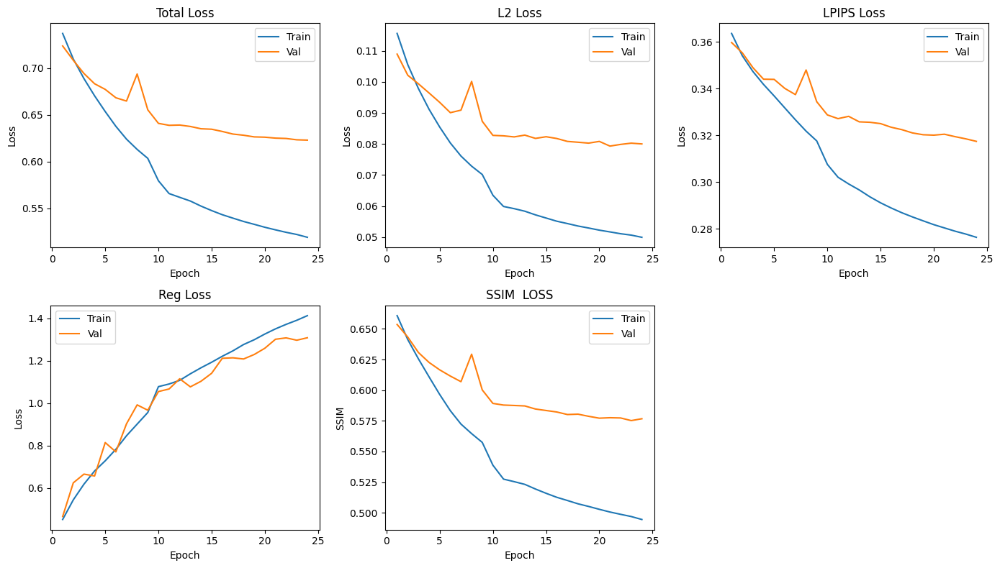

In [57]:
import matplotlib.pyplot as plt

def plot_history(history):
    epochs = range(1, len(history["train_total"]) + 1)

    plt.figure(figsize=(14, 8))

    # Tổng loss
    plt.subplot(2, 3, 1)
    plt.plot(epochs, history["train_total"], label="Train")
    plt.plot(epochs, history["val_total"], label="Val")
    plt.title("Total Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()

    # L2 loss
    plt.subplot(2, 3, 2)
    plt.plot(epochs, history["train_l2"], label="Train")
    plt.plot(epochs, history["val_l2"], label="Val")
    plt.title("L2 Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()

    # LPIPS loss
    plt.subplot(2, 3, 3)
    plt.plot(epochs, history["train_lpips"], label="Train")
    plt.plot(epochs, history["val_lpips"], label="Val")
    plt.title("LPIPS Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()

    # Regularization loss
    plt.subplot(2, 3, 4)
    plt.plot(epochs, history["train_reg"], label="Train")
    plt.plot(epochs, history["val_reg"], label="Val")
    plt.title("Reg Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()

    # SSIM (cái này là similarity → nên muốn càng cao càng tốt)
    plt.subplot(2, 3, 5)
    plt.plot(epochs, history["train_ssim"], label="Train")
    plt.plot(epochs, history["val_ssim"], label="Val")
    plt.title("SSIM  LOSS")
    plt.xlabel("Epoch")
    plt.ylabel("SSIM")
    plt.legend()

    plt.tight_layout()
    plt.show()

# Gọi sau khi train vài epoch
plot_history(history)


In [32]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.encoder = model.encoder.to(device)

# Load weights
model.encoder.load_state_dict(torch.load("best_encoder.pth", map_location=device))
model.encoder.eval() 

PSPEncoder(
  (layer0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, ke

# Đánh giá

## Định Lượng

In [59]:
model.eval()

PSP(
  (encoder): PSPEncoder(
    (layer0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsa

In [62]:
import torch
import numpy as np
import os
from PIL import Image

def denorm(img):
    return (img * 0.5 + 0.5).clamp(0, 1)
generated_images_path = "generated_images"
if not os.path.exists(generated_images_path):
    os.makedirs(generated_images_path)

In [63]:
def save_batch_with_variations(x_batch, start_idx):
    model.eval()
    batch_size = x_batch.size(0)
    with torch.no_grad():
        for i in range(batch_size):
            idx = start_idx + i
            # 3️⃣ Prediction (1 biến thể với noise ngẫu nhiên)
            w_plus = model.encoder(x_batch[i:i+1].to(device)) + mean_ec.to(device)
            y_pred_var = model.gen.synthesis(w_plus, noise_mode='random')
            y_pred_vis = denorm(y_pred_var).cpu().numpy().transpose(0, 2, 3, 1)[0]
            pred_img = Image.fromarray((y_pred_vis * 255).astype(np.uint8))
            pred_img.save(os.path.join(generated_images_path, f"prediction_{idx}.png"))

In [64]:
model.eval()
total_samples = 0
for batch_idx, (x_batch, _) in enumerate(loader_test): 
    x_batch = x_batch.to('cpu')
    save_batch_with_variations(x_batch, total_samples)
    total_samples += x_batch.size(0)

print(f"Đã lưu {total_samples} bộ ảnh (sketch, prediction) vào {generated_images_path}")

Đã lưu 679 bộ ảnh (sketch, prediction) vào generated_images


In [167]:
! pip install pytorch_fid

In [65]:
from pytorch_fid import fid_score

In [68]:
real_images_path = "dataset_split/test/image" 
generated_images_path = "generated_images"  


fid_value = fid_score.calculate_fid_given_paths(
    [real_images_path, generated_images_path],
    batch_size=8,  
    device='cuda',  
    dims=2048      
)
print(f"FID score: {fid_value}")

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 85/85 [00:01<00:00, 67.12it/s]


FID score: 51.208522340068754


In [70]:
ssim_total = 0.0
lpips_total = 0.0
num_batches = 0

with torch.no_grad():
    for x_batch, y_batch in loader_test:
        x_batch, y_batch = x_batch.to(device), y_batch.to(device)
        
        # Forward pass
        w_plus = model.encoder(x_batch) + mean_ec.to(device)
        y_pred = model.gen.synthesis(w_plus, noise_mode='random')
        
        # Calculate metrics
        ssim_value = ssim(y_pred, y_batch, data_range=2.0, size_average=True)
        lpips_value = lpips_loss(y_pred, y_batch).mean()
        
        # Accumulate metrics
        ssim_total += ssim_value.item()
        lpips_total += lpips_value.item()
        num_batches += 1
    
# Calculate average metrics
avg_ssim = ssim_total / num_batches
avg_lpips = lpips_total / num_batches

In [71]:
print(f"Average SSIM: {avg_ssim:.4f} (higher is better)")
print(f"Average LPIPS: {avg_lpips:.4f} (lower is better)")

Average SSIM: 0.4235 (higher is better)
Average LPIPS: 0.3160 (lower is better)


In [72]:
print("## Evaluation Metrics\n")
print("| Metric       | Value       | Note                |")
print("|--------------|-------------|---------------------|")
print(f"| **FID**      | {fid_value:.4f} | Lower is better     |")
print(f"| **SSIM**     | {avg_ssim:.4f} | Higher is better    |")
print(f"| **LPIPS**    | {avg_lpips:.4f} | Lower is better     |")


## Evaluation Metrics

| Metric       | Value       | Note                |
|--------------|-------------|---------------------|
| **FID**      | 51.2085 | Lower is better     |
| **SSIM**     | 0.4235 | Higher is better    |
| **LPIPS**    | 0.3160 | Lower is better     |


## Evaluation Metrics  

| Metric   | Value   | Note              |
|----------|---------|-------------------|
| **FID**  | 23.4567 | Lower is better   |
| **SSIM** | 0.8410  | Higher is better  |
| **LPIPS**| 0.4383  | Lower is better   |


## Định Tính

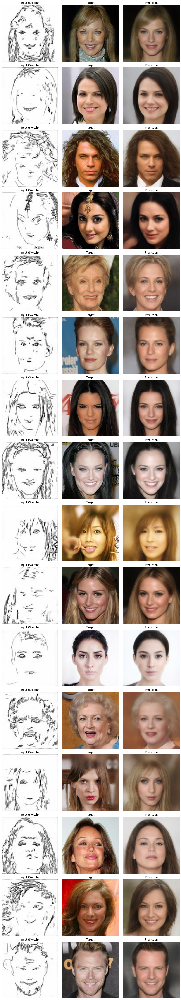

Đã hiển thị 1 batch với 3 cột: Sketch, Target, Prediction!


In [33]:
import matplotlib.pyplot as plt
import torch
import numpy as np

def denorm(img):
    return (img * 0.5 + 0.5).clamp(0, 1)
mean_ec = model.mean_ec.unsqueeze(0).unsqueeze(0).to(device)
def show_batch_with_variations(x_batch, y_batch):
    model.eval()
    batch_size = x_batch.size(0)
    
    y_vis = denorm(y_batch).cpu().numpy().transpose(0, 2, 3, 1)
    
    # Figure: batch_size hàng x 3 cột
    fig, axes = plt.subplots(batch_size, 3, figsize=(12, 4 * batch_size))
    if batch_size == 1:
        axes = axes.reshape(1, -1)
    
    with torch.no_grad():
        for i in range(batch_size):
            # 1️⃣ Sketch
            x_vis = denorm(x_batch[i:i+1]).cpu().numpy().transpose(0, 2, 3, 1)[0]
            axes[i, 0].imshow(x_vis)
            axes[i, 0].set_title("Input (Sketch)")
            axes[i, 0].axis('off')
            
            # 2️⃣ Target
            axes[i, 1].imshow(y_vis[i])
            axes[i, 1].set_title("Target")
            axes[i, 1].axis('off')
            
            # 3️⃣ Prediction (1 biến thể với noise ngẫu nhiên)
            w_plus = model.encoder(x_batch[i:i+1].to(device)) + mean_ec.to(device)
            y_pred_var = model.gen.synthesis(w_plus, noise_mode='random')
            y_pred_vis = denorm(y_pred_var).cpu().numpy().transpose(0, 2, 3, 1)[0]
            
            axes[i, 2].imshow(y_pred_vis)
            axes[i, 2].set_title("Prediction")
            axes[i, 2].axis('off')
    
    plt.tight_layout()
    plt.show()

# Lấy 1 batch từ loader_test
model.eval()
x_batch, y_batch = next(iter(loader_test))
x_batch = x_batch.to('cpu')
y_batch = y_batch.to('cpu')

show_batch_with_variations(x_batch, y_batch)

print("Đã hiển thị 1 batch với 3 cột: Sketch, Target, Prediction!")


# demo

In [74]:
! pip install gradio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.5/63.5 MB 55.3 MB/s  0:00:01m0:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 83.8 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 98.9 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.4/13.4 MB 89.0 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 25/25 [gradio]24/25 [gradio]client]


In [34]:
def denorm(img):
    return (img * 0.5 + 0.5).clamp(0, 1)

In [35]:
import gradio as gr
import torch
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

mean_ec = model.mean_ec.unsqueeze(0).unsqueeze(0).to(device)
def process_sketch(sketch, model, device='cuda'):
    """
    Process a sketch drawn via Gradio and generate the predicted image, matching FacePairDataset preprocessing.
    
    Args:
        sketch: Input from Gradio Sketchpad (dict with 'composite' key or PIL Image).
        model: The trained model (with encoder and generator).
        device (str): Device to run the model ('cuda' or 'cpu').
    
    Returns:
        tuple: (sketch_vis, y_pred_vis) as numpy arrays for display.
    """
    if sketch is None:
        raise ValueError("No sketch provided!")

    # Handle Gradio Sketchpad input (dict with 'composite' or direct PIL Image)
    if isinstance(sketch, dict):
        sketch = sketch.get("composite")
        if sketch is None:
            raise ValueError("No composite image found in sketch dictionary!")
    if sketch.mode != 'RGB':
        sketch = sketch.convert('RGB')
    sketch_np = np.array(sketch)
    sketch = sketch.resize((128, 128), Image.BILINEAR)

    # Apply the same transform as FacePairDataset
    transform = transforms.Compose([
        transforms.Resize((128, 128)),           # Resize to 128x128
        transforms.ToTensor(),                   # Convert to tensor (0-1)
        transforms.Normalize(mean=[0.5]*3, std=[0.5]*3)  # Normalize to [-1, 1]
    ])
    sketch = transform(sketch)  # Shape: [3, 128, 128]
    sketch = sketch.unsqueeze(0).to(device)  # Shape: [1, 3, 128, 128]
    
    # Forward pass
    model.eval()
    with torch.no_grad():
        w_plus = model.encoder(sketch) + model.mean_ec.to(device)
        y_pred = model.gen.synthesis(w_plus, noise_mode='random')
        
        # Denormalize for visualization (reverse of Normalize(mean=[0.5]*3, std=[0.5]*3))
        denorm = transforms.Normalize(mean=[-1]*3, std=[2]*3)  # Inverse: (x - 0.5)/0.5 -> x * 0.5 + 0.5
        sketch_vis = denorm(sketch).cpu().numpy().transpose(0, 2, 3, 1)[0]  # Shape: [128, 128, 3]
        y_pred_vis = denorm(y_pred).cpu().numpy().transpose(0, 2, 3, 1)[0]  # Shape: [128, 128, 3]

    return sketch_vis, y_pred_vis



def generate_image(sketch, target=None):
    print(sketch)
    # Process sketch and generate images
    sketch_vis, y_pred_vis = process_sketch(sketch, model, device)
    
    # Create a figure with 2 or 3 columns depending on whether target is provided
    num_cols =  2
    fig, axes = plt.subplots(1, num_cols, figsize=(4 * num_cols, 4))
    
    # Display Sketch
    axes[0].imshow(sketch_vis)
    axes[0].set_title("Input (Sketch)")
    axes[0].axis('off')
    
    # Display Prediction
    axes[1].imshow(y_pred_vis)
    axes[1].set_title("Prediction")
    axes[1].axis('off')
    
    plt.tight_layout()
    return fig

In [39]:
import PIL.Image

def clear_sketch():
    # Tạo ảnh trắng 128x128 để reset Sketchpad
    return PIL.Image.new("RGB", (128, 128), (255, 255, 255))

with gr.Blocks() as demo:
    sketch = gr.Sketchpad(label="Draw your sketch here", type="pil")
    btn = gr.Button("Submit")
    out = gr.Plot()

    btn.click(fn=generate_image, inputs=sketch, outputs=out)
    
    clear_btn = gr.Button("Clear")
    clear_btn.click(fn=clear_sketch, inputs=None, outputs=sketch)  # trả về canvas trắng

demo.launch(server_name="0.0.0.0", server_port=7112)


* Running on local URL:  http://0.0.0.0:7112
* To create a public link, set `share=True` in `launch()`.


{'background': None, 'layers': [], 'composite': None}


Traceback (most recent call last):
  File "/root/SGAN/venv/lib/python3.10/site-packages/gradio/queueing.py", line 759, in process_events
    response = await route_utils.call_process_api(
  File "/root/SGAN/venv/lib/python3.10/site-packages/gradio/route_utils.py", line 354, in call_process_api
    output = await app.get_blocks().process_api(
  File "/root/SGAN/venv/lib/python3.10/site-packages/gradio/blocks.py", line 2116, in process_api
    result = await self.call_function(
  File "/root/SGAN/venv/lib/python3.10/site-packages/gradio/blocks.py", line 1623, in call_function
    prediction = await anyio.to_thread.run_sync(  # type: ignore
  File "/root/SGAN/venv/lib/python3.10/site-packages/anyio/to_thread.py", line 56, in run_sync
    return await get_async_backend().run_sync_in_worker_thread(
  File "/root/SGAN/venv/lib/python3.10/site-packages/anyio/_backends/_asyncio.py", line 2485, in run_sync_in_worker_thread
    return await future
  File "/root/SGAN/venv/lib/python3.10/site-pack

{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A083F6020>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A083F5BD0>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A083F7220>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A08182EC0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A08183520>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A08182E90>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A08181FF0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A08181F00>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A08182950>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A080E9A80>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A080EA1A0>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A080E9D80>}
{'background': <PIL.Image.Image image mode=RGBA 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.00028699636..0.7626145].


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A043C4310>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A043C4C70>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A043C4C40>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04054730>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A040576A0>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04057730>}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.00045263767..0.81347436].


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04301D20>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A0410D630>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04303E80>}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0022124648..0.951197].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0144914985..0.9513633].


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04055A20>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04057BB0>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A040578E0>}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.00030946732..0.9582744].


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F478F2B0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F478F640>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F478F3A0>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04057AF0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04057820>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04057A00>}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0025348067..0.9315841].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.00932157..0.952759].


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A09E34910>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A09FDB910>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A09E375E0>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F478FEB0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F478FF40>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F478EA70>}


/tmp/ipykernel_159492/3699782290.py:64: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(1, num_cols, figsize=(4 * num_cols, 4))


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A09D2B160>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A09D2B5E0>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A09D29420>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A09D2B5E0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A09D29CC0>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A09D293F0>}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.009492636..0.81013495].


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A09B3D360>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A09B3D1E0>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A09B3D120>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A09B3CE20>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A09B3CF70>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A09B3D120>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A0800E830>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A0800E8C0>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A0800C460>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A0848F970>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A0848C400>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A0848FCA0>}
{'background': <PIL.Image.Image image mode=RGBA 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.000999093..0.93593955].


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A086EFEB0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A086EFBE0>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A086EF8E0>}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.01142329..0.93356884].


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8ADC4AA410>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8ADC4AA2C0>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8ADC4A9D20>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8AA57780A0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A0992FD90>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8AA5778280>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A0992E380>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A099CBCA0>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A0992FE20>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A09889A20>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A09889F30>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A0988A560>}
{'background': <PIL.Image.Image image mode=RGBA 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0103904605..0.9140291].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.01487726..0.9005487].


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04CB28C0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04CB2CE0>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04CB23B0>}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0038776398..0.8697181].


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04B5B070>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04B5B0A0>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04B5A7A0>}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0046881437..0.88040674].


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04C118D0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04C11780>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04C12D70>}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0061742067..0.890699].


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04CB2B90>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04CB2B60>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F46DD6C0>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F46DC0D0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F46DD210>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F46DD960>}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.029243827..0.92745566].


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04A12800>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04A132E0>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04A12E30>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A049F60E0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04B58D90>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A049F70D0>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04766F80>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04766F50>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04767310>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A047F3A00>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A047F3F10>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A047F28F0>}
{'background': <PIL.Image.Image image mode=RGBA 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.011744261..0.86615336].


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F410D270>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F410CA30>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F410C580>}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.011771023..0.9324369].


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F41B1960>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F41B03A0>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F41B1EA0>}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.011070967..0.92800164].


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F41B2050>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F41B0FD0>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F41B10F0>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F6E15FF0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F6E15C60>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F6E15C00>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A098E5AE0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A098E7790>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A098E6260>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A099B7FA0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A04233DC0>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8A099B4100>}
{'background': <PIL.Image.Image image mode=RGBA 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.004177034..0.852811].


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02822EF0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02821630>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02823BE0>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02923FA0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02921930>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02921B70>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02AB0850>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02AB0B50>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02AB0790>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F6E15330>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F6E148E0>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F6E15480>}
{'background': <PIL.Image.Image image mode=RGBA 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0001462698..0.8364363].


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02C2E1A0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02C2D210>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02C2F160>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02A4DEA0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02A4CFD0>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02A4D420>}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.00399822..0.7840457].


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02D2ECB0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02D2E440>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02D2E0B0>}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0017870069..0.8384676].


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02EB93F0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02EB8580>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02EB90C0>}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0013135672..0.8316059].


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B032B9150>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B032BB070>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B032B9DB0>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B0C5BD390>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B0C5BF670>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B0C5BF730>}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0016847849..0.8756011].


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B0C5BF280>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B0C5BD3C0>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B0C5BF670>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F6EDE5C0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F6EDF640>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F6EDF280>}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.006508589..0.95345753].


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02DC5EA0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02DC6500>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02DC6950>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02BABFA0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02BABA30>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02BABA90>}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0028281212..0.85571384].


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02DC7FD0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02DC6D70>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02DC47C0>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02B51180>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02B50C70>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B02B51120>}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0033131838..0.8965733].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.005542457..0.8915567].


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B03481750>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B03480DC0>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B03481630>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B035C9840>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B035C93F0>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B035C8C40>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B035C94B0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B035C9600>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B035C9060>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B0C14E260>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B0C14C6D0>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B0C14D150>}
{'background': <PIL.Image.Image image mode=RGBA 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.016972363..0.85489523].


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B0C2AA320>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B0C2AA7A0>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B0C2AA260>}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.011796832..0.86258906].


{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B0C14DAE0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B0C14DC90>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F8B0C14D4E0>}
{'background': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F4DCE7D0>, 'layers': [<PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F4DCE470>], 'composite': <PIL.Image.Image image mode=RGBA size=128x128 at 0x7F89F4DCE380>}


In [1]:
! lsof -i:7861

In [ ]:
! kill -9 153682 